Mattes uses `hg38-reseq.bed` for extracting flanked exons for the data set.

I use `Homo_sapiens.gtf` for the annotations that are used in evaluation after training (how many human exons were hit 
etc.)

Issues with that:

- Mattes takes _all_ exons (provided they match some requirements like flanking intron length etc.), but often they are
  `XM_...` transcripts, i.e. predicted but not curated
- This leads sometimes to cases like an exon extracted from BED that has no annotaion in GTF
  - Solution: only extract exons from BED that are `NM...`, i.e. curated, this solves _some_ of these issues
  
- GTF still proivdes multiple transcripts for many exons

Here, check the overlap or gap between the annotations in the BED file and GTF file

In [22]:
SEED = 42 # in case its needed

import os
import pandas as pd
import plotly.graph_objects as go
import re
from tqdm import tqdm
import sys
sys.path.insert(0, 'modules/')
import importlib

#import sequtils as su
#print(importlib.reload(su))
#import SequenceRepresentation
#print(importlib.reload(SequenceRepresentation))
#import ProfileFindingSetup
#print(importlib.reload(ProfileFindingSetup))
from get_internal_exon import parseGTF, parse_bed

In [2]:
bedfile = "/home/jovyan/brain/genomegraph/data/241_species/hg38-refseq.bed"
gtffile = "/home/jovyan/brain/genomegraph/data/241_species/annot/Homo_sapiens.gtf"

In [3]:
bed_full = parse_bed(bedfile)
bed_full

,chrom,chromStart,chromEnd,name,score,strand,thickStart,thickEnd,itemRgb,blockCount,blockSizes,blockStarts
0,chr1,67092164,67109072,XM_011541469.2,0,-,67093004,67103382,0,5,"[1440, 187, 70, 145, 44]","[0, 3070, 4087, 11073, 16864]"
1,chr1,67092164,67131227,XM_017001276.2,0,-,67093004,67127240,0,9,"[1440, 187, 70, 145, 68, 113, 158, 92, 86]","[0, 3070, 4087, 11073, 19412, 23187, 33587, 35..."
2,chr1,67092164,67131227,XM_011541467.2,0,-,67093004,67127240,0,9,"[1440, 187, 70, 106, 68, 113, 158, 92, 86]","[0, 3070, 4087, 11073, 19412, 23187, 33587, 35..."
3,chr1,67092164,67134970,NM_001276352.2,0,-,67093579,67127240,0,9,"[1440, 70, 145, 68, 113, 158, 92, 86, 41]","[0, 4087, 11073, 19412, 23187, 33587, 35001, 3..."
4,chr1,67092164,67134970,NM_001276351.2,0,-,67093004,67127240,0,8,"[1440, 187, 70, 113, 158, 92, 86, 41]","[0, 3070, 4087, 23187, 33587, 35001, 38977, 42..."
...,...,...,...,...,...,...,...,...,...,...,...,...
188347,chr22_KI270733v1_random,128876,129032,NR_146120.1,0,+,129032,129032,0,1,[156],[0]
188348,chr22_KI270733v1_random,137952,140657,XR_951367.3,0,+,140657,140657,0,3,"[1572, 97, 516]","[0, 1965, 2189]"
188349,chr22_KI270733v1_random,140978,143466,XR_001756152.2,0,+,143466,143466,0,3,"[151, 92, 376]","[0, 312, 2112]"
188350,chr22_KI270733v1_random,171576,174046,XM_047442803.1,0,-,172877,174046,0,2,"[2076, 11]","[0, 2459]"


In [4]:
gtf = parseGTF(gtffile)
gtf

,seqname,source,feature,start,end,score,strand,frame,attribute
0,chr1,BestRefSeq,CDS,69090,70008,NaN,+,0,"gene_id ""gene-OR4F5""; transcript_id ""rna-NM_00..."
1,chr1,BestRefSeq,start_codon,69090,69093,NaN,+,0,"gene_id ""gene-OR4F5""; transcript_id ""rna-NM_00..."
2,chr1,BestRefSeq,stop_codon,70005,70008,NaN,+,0,"gene_id ""gene-OR4F5""; transcript_id ""rna-NM_00..."
3,chr1,Gnomon,CDS,358066,358183,NaN,-,0,"gene_id ""gene-LOC112268260""; transcript_id ""rn..."
4,chr1,Gnomon,CDS,373143,373323,NaN,-,0,"gene_id ""gene-LOC112268260""; transcript_id ""rn..."
...,...,...,...,...,...,...,...,...,...
3044472,KZ559113.1,BestRefSeq,intron,201915,260248,NaN,-,1,"gene_id ""gene-XYLT1-2""; transcript_id ""rna-NM_..."
3044473,KZ559113.1,BestRefSeq,intron,260759,359272,NaN,-,0,"gene_id ""gene-XYLT1-2""; transcript_id ""rna-NM_..."
3044474,KZ559113.1,BestRefSeq,intron,359311,471694,NaN,-,0,"gene_id ""gene-XYLT1-2""; transcript_id ""rna-NM_..."
3044475,KZ559113.1,BestRefSeq,start_codon,472054,472057,NaN,-,0,"gene_id ""gene-XYLT1-2""; transcript_id ""rna-NM_..."


In [5]:
# extract transcript_ids from gtf
def extractTranscriptID(attribute):
    m = re.search("transcript_id \"rna-([^\"]+)", attribute)
    return m.group(1) if m else "None"

gtf['name'] = gtf['attribute'].map(extractTranscriptID)
gtfnames = set(gtf['name']) # speedup queries
gtf

,seqname,source,feature,start,end,score,strand,frame,attribute,name
0,chr1,BestRefSeq,CDS,69090,70008,NaN,+,0,"gene_id ""gene-OR4F5""; transcript_id ""rna-NM_00...",NM_001005484.1
1,chr1,BestRefSeq,start_codon,69090,69093,NaN,+,0,"gene_id ""gene-OR4F5""; transcript_id ""rna-NM_00...",NM_001005484.1
2,chr1,BestRefSeq,stop_codon,70005,70008,NaN,+,0,"gene_id ""gene-OR4F5""; transcript_id ""rna-NM_00...",NM_001005484.1
3,chr1,Gnomon,CDS,358066,358183,NaN,-,0,"gene_id ""gene-LOC112268260""; transcript_id ""rn...",XM_024451963.1
4,chr1,Gnomon,CDS,373143,373323,NaN,-,0,"gene_id ""gene-LOC112268260""; transcript_id ""rn...",XM_024451963.1
...,...,...,...,...,...,...,...,...,...,...
3044472,KZ559113.1,BestRefSeq,intron,201915,260248,NaN,-,1,"gene_id ""gene-XYLT1-2""; transcript_id ""rna-NM_...",NM_022166.3-2
3044473,KZ559113.1,BestRefSeq,intron,260759,359272,NaN,-,0,"gene_id ""gene-XYLT1-2""; transcript_id ""rna-NM_...",NM_022166.3-2
3044474,KZ559113.1,BestRefSeq,intron,359311,471694,NaN,-,0,"gene_id ""gene-XYLT1-2""; transcript_id ""rna-NM_...",NM_022166.3-2
3044475,KZ559113.1,BestRefSeq,start_codon,472054,472057,NaN,-,0,"gene_id ""gene-XYLT1-2""; transcript_id ""rna-NM_...",NM_022166.3-2


In [46]:
# only interested in `NM_...` subset of BED & transcripts with at least three exons
bed = bed_full[bed_full['name'].map(lambda x: x.startswith("NM_")) & bed_full['blockCount'].map(lambda x: x >= 3)]
bed

,chrom,chromStart,chromEnd,name,score,strand,thickStart,thickEnd,itemRgb,blockCount,blockSizes,blockStarts
3,chr1,67092164,67134970,NM_001276352.2,0,-,67093579,67127240,0,9,"[1440, 70, 145, 68, 113, 158, 92, 86, 41]","[0, 4087, 11073, 19412, 23187, 33587, 35001, 3..."
4,chr1,67092164,67134970,NM_001276351.2,0,-,67093004,67127240,0,8,"[1440, 187, 70, 113, 158, 92, 86, 41]","[0, 3070, 4087, 23187, 33587, 35001, 38977, 42..."
9,chr1,201283505,201332989,NM_001005337.3,0,+,201283702,201328836,0,14,"[399, 104, 395, 145, 208, 178, 115, 156, 177, ...","[0, 10436, 29660, 33047, 34066, 35112, 36761, ..."
10,chr1,201283505,201332989,NM_000299.4,0,+,201283702,201328836,0,15,"[399, 104, 395, 145, 208, 178, 63, 115, 156, 1...","[0, 10436, 29660, 33047, 34066, 35112, 36310, ..."
11,chr1,8352403,8423832,NM_001042682.2,0,-,8355086,8364133,0,13,"[2717, 181, 147, 721, 223, 1379, 114, 162, 200...","[0, 3015, 3696, 5792, 7360, 7708, 9359, 10279,..."
...,...,...,...,...,...,...,...,...,...,...,...,...
188171,chr22_KQ759761v1_alt,51430,106747,NM_005650.4,0,-,60052,106709,0,5,"[1346, 128, 50, 94, 5693]","[0, 8578, 9816, 19582, 49624]"
188172,chr22_KQ759762v2_fix,8916,69331,NM_001372044.2,0,+,10508,67431,0,23,"[31, 627, 204, 72, 109, 152, 168, 117, 78, 67,...","[0, 1253, 2223, 3805, 5768, 5952, 6202, 6495, ..."
188174,chr22_KQ759762v2_fix,74323,81453,NM_001097.3,0,+,74355,81321,0,5,"[109, 204, 284, 146, 687]","[0, 1067, 1490, 5851, 6443]"
188195,chr1_KI270711v1_random,4610,32450,NM_001395905.1,0,-,6126,29453,0,24,"[1760, 112, 173, 52, 173, 52, 173, 52, 164, 52...","[0, 2380, 3206, 3993, 4754, 5529, 6300, 7096, ..."


In [45]:
bed[bed['name'].map(lambda x: x in gtfnames)] # BED lines with matching GTF features based on transcript name

,chrom,chromStart,chromEnd,name,score,strand,thickStart,thickEnd,itemRgb,blockCount,blockSizes,blockStarts
205,chr1,14598716,15068155,NM_015209.2,0,+,14598997,15065797,0,8,"[507, 192, 137, 171, 190, 131, 51, 2526]","[0, 361967, 436032, 445272, 457374, 461455, 46..."
252,chr1,20806291,21111383,NM_003760.4,0,-,20807318,21002742,0,32,"[1209, 147, 82, 147, 99, 82, 126, 173, 116, 22...","[0, 4446, 6866, 11100, 18808, 21325, 22855, 34..."
279,chr1,20941243,21168039,NM_001198803.2,0,-,20941375,21002742,0,13,"[152, 840, 109, 123, 98, 115, 180, 33, 96, 129...","[0, 247, 8759, 28230, 31758, 39090, 39804, 563..."
317,chr1,39841030,39883511,NM_001312691.1,0,-,39841743,39883491,0,10,"[883, 118, 110, 113, 112, 143, 146, 99, 141, 194]","[0, 3070, 3500, 6517, 6955, 9088, 11700, 12939..."
318,chr1,39841030,39883511,NM_001312692.1,0,-,39841743,39883491,0,9,"[883, 118, 110, 78, 113, 106, 143, 146, 194]","[0, 3070, 3500, 6189, 6517, 6955, 9088, 11700,..."
...,...,...,...,...,...,...,...,...,...,...,...,...
188068,chr22_KI270879v1_alt,270307,278486,NM_001293811.1,0,-,270597,271170,0,4,"[485, 177, 88, 192]","[0, 689, 5567, 7987]"
188069,chr22_KI270879v1_alt,270307,278486,NM_001293813.1,0,-,270674,278406,0,3,"[485, 88, 192]","[0, 5567, 7987]"
188070,chr22_KI270879v1_alt,270307,278486,NM_001293810.1,0,-,270597,271170,0,4,"[485, 177, 151, 192]","[0, 689, 3228, 7987]"
188071,chr22_KI270879v1_alt,270307,278486,NM_001293808.1,0,-,270597,271170,0,4,"[485, 177, 90, 192]","[0, 689, 3228, 7987]"


In [41]:
print(f"NM_ Filtering reduces BED lines from {len(bed_full):,} fo {len(bed):,}")

NM_ Filtering reduces BED lines from 188,352 fo 67,704


In [8]:
# example BED name with matching name in GTF
gtf[gtf['name'] == 'NM_000028.2']

,seqname,source,feature,start,end,score,strand,frame,attribute,name
146876,chr1,BestRefSeq,CDS,99851042,99851124,NaN,+,0,"gene_id ""gene-AGL""; transcript_id ""rna-NM_0000...",NM_000028.2
146877,chr1,BestRefSeq,CDS,99861502,99861713,NaN,+,2,"gene_id ""gene-AGL""; transcript_id ""rna-NM_0000...",NM_000028.2
146878,chr1,BestRefSeq,CDS,99862256,99862423,NaN,+,1,"gene_id ""gene-AGL""; transcript_id ""rna-NM_0000...",NM_000028.2
146879,chr1,BestRefSeq,CDS,99864385,99864589,NaN,+,2,"gene_id ""gene-AGL""; transcript_id ""rna-NM_0000...",NM_000028.2
146880,chr1,BestRefSeq,CDS,99870399,99870581,NaN,+,2,"gene_id ""gene-AGL""; transcript_id ""rna-NM_0000...",NM_000028.2
...,...,...,...,...,...,...,...,...,...,...
146938,chr1,BestRefSeq,intron,99915486,99916409,NaN,+,2,"gene_id ""gene-AGL""; transcript_id ""rna-NM_0000...",NM_000028.2
146939,chr1,BestRefSeq,intron,99916497,99916597,NaN,+,0,"gene_id ""gene-AGL""; transcript_id ""rna-NM_0000...",NM_000028.2
146940,chr1,BestRefSeq,intron,99916731,99921533,NaN,+,2,"gene_id ""gene-AGL""; transcript_id ""rna-NM_0000...",NM_000028.2
146941,chr1,BestRefSeq,start_codon,99851042,99851045,NaN,+,0,"gene_id ""gene-AGL""; transcript_id ""rna-NM_0000...",NM_000028.2


In [9]:
sorted(set(bed['name']))[:15]

['NM_000014.6',
 'NM_000016.6',
 'NM_000017.4',
 'NM_000018.4',
 'NM_000019.4',
 'NM_000020.3',
 'NM_000021.4',
 'NM_000022.4',
 'NM_000023.4',
 'NM_000026.4',
 'NM_000027.4',
 'NM_000028.2',
 'NM_000030.3',
 'NM_000031.6',
 'NM_000032.5']

In [10]:
sorted(set(gtf['name']))[:15]

['NM_000014.5',
 'NM_000015.2',
 'NM_000016.5',
 'NM_000017.3',
 'NM_000018.3',
 'NM_000019.3',
 'NM_000020.2',
 'NM_000021.3',
 'NM_000022.3',
 'NM_000023.3',
 'NM_000024.5',
 'NM_000025.2',
 'NM_000026.3',
 'NM_000027.3',
 'NM_000028.2']

---

Only 4440 BED names with matching annotations in GTF.

But how many of the BED exons will have a matching GTF annotation based on the exon coordinates?

In [16]:
if not os.path.exists("20230920_bed_coverage.json"):
    bed_coverage = {}
    for row in tqdm(bed.itertuples(), total = len(bed)):
        #print(row)
        # rows with annotations fully inside the BED gene
        gtfrows = gtf[(gtf['seqname'] == row.chrom) & (row.chromStart <= gtf['start']) & (gtf['end'] <= row.chromEnd)]
        #print(gtfrows)
        bed_coverage[row.name] = []
        for i in range(1, row.blockCount): # omit first and last exon
            # features that exactly match the exon
            #print(f"Exon {row.chromStart + row.blockStarts[i]} - {row.chromStart + row.blockStarts[i] + row.blockSizes[i]}")
            gtffeature = gtfrows[(gtfrows['start'] == row.chromStart + row.blockStarts[i]) \
                                 & (gtfrows['end'] == row.chromStart + row.blockStarts[i] + row.blockSizes[i]) \
                                 & (gtfrows['feature'] == 'CDS')]
            #print(f"len {len(gtffeature)}")
            #print(gtffeature)
            bed_coverage[row.name].append({'exon': i, 'nfeatures': len(gtffeature), 'sources': set(gtffeature['source'])})

        #break        

100%|██████████| 67704/67704 [1:43:57<00:00, 10.85it/s]


In [ ]:
import json

if not os.path.exists("20230920_bed_coverage.json"):
    # deal with sets so json doesn't bitch about it
    class SetEncoder(json.JSONEncoder):
        def default(self, obj):
            if isinstance(obj, set):
                return list(obj)
            return json.JSONEncoder.default(self, obj)

    with open("20230920_bed_coverage.json", "wt") as fh:
        json.dump(bed_coverage, fh, cls=SetEncoder)
else:
    with open("20230920_bed_coverage.json", "rt") as fh:
        bed_coverage = json.load(fh)

In [18]:
for key in bed_coverage:
    print(key)
    print(bed_coverage[key])
    break

NM_001276352.2
[{'exon': 1, 'nfeatures': 9, 'sources': {'BestRefSeq', 'Gnomon'}}, {'exon': 2, 'nfeatures': 6, 'sources': {'BestRefSeq', 'Gnomon'}}, {'exon': 3, 'nfeatures': 8, 'sources': {'BestRefSeq', 'Gnomon'}}, {'exon': 4, 'nfeatures': 10, 'sources': {'BestRefSeq', 'Gnomon'}}, {'exon': 5, 'nfeatures': 10, 'sources': {'BestRefSeq', 'Gnomon'}}, {'exon': 6, 'nfeatures': 0, 'sources': set()}, {'exon': 7, 'nfeatures': 0, 'sources': set()}, {'exon': 8, 'nfeatures': 0, 'sources': set()}]


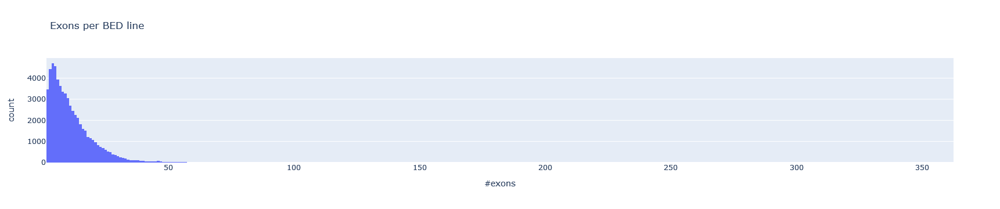

In [51]:
fig = go.Figure()
fig.add_trace(go.Histogram(
    x = [len(bed_coverage[transcript]) for transcript in bed_coverage]
))
fig.update_layout(
    title = "Exons per BED line",
    xaxis_title_text = "#exons",
    yaxis_title_text = "count"
)

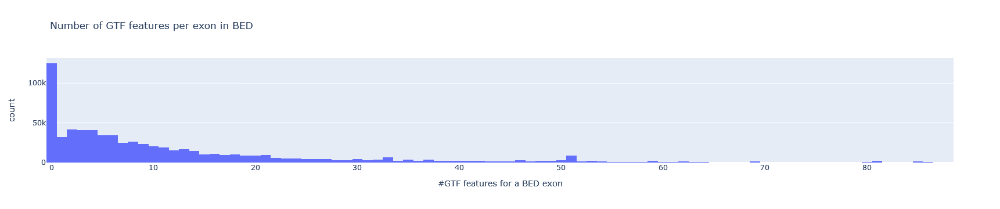

In [33]:
fig = go.Figure()
fig.add_trace(go.Histogram(
    x = [exon['nfeatures'] for transcript in bed_coverage for exon in bed_coverage[transcript]]
))
fig.update_layout(
    title = "Number of GTF features per exon in BED",
    xaxis_title_text = "#GTF features for a BED exon",
    yaxis_title_text = "count"
)

In [43]:
print("Number of GTF-covered exons in BED:", f"{sum([int(exon['nfeatures'] > 0) for transcript in bed_coverage for exon in bed_coverage[transcript]]):,}",
      f"/ {sum([len(bed_coverage[tx]) for tx in bed_coverage]):,}")
print("Number of GTF-BestRefSeq-covered exons in BED:", f"{sum([int(exon['nfeatures'] > 0 and 'BestRefSeq' in exon['sources']) for transcript in bed_coverage for exon in bed_coverage[transcript]]):,}", 
      f"/ {sum([len(bed_coverage[tx]) for tx in bed_coverage]):,}")

print("Number of not-covered exons in BED:", f"{sum([int(exon['nfeatures'] <= 0) for transcript in bed_coverage for exon in bed_coverage[transcript]]):,}", 
      f"/ {sum([len(bed_coverage[tx]) for tx in bed_coverage]):,}")

Number of GTF-covered exons in BED: 571,817 / 696,903
Number of GTF-BestRefSeq-covered exons in BED: 566,664 / 696,903
Number of not-covered exons in BED: 125,086 / 696,903


In [50]:
print(f"BED lines with any covered exons: {sum(int(any([exon['nfeatures'] > 0 for exon in bed_coverage[transcript]])) for transcript in bed_coverage):,}",
      f"/ {len(bed):,}")
print(f"BED lines with any BestRefSeq-covered exons: {sum(int(any([exon['nfeatures'] > 0 and 'BestRefSeq' in exon['sources'] for exon in bed_coverage[transcript]])) for transcript in bed_coverage):,}",
      f"/ {len(bed):,}")
print(f"BED lines with all exons covered: {sum(int(all([exon['nfeatures'] > 0 for exon in bed_coverage[transcript]])) for transcript in bed_coverage):,}",
      f"/ {len(bed):,}")

BED lines with any covered exons: 55,731 / 67,704
BED lines with any BestRefSeq-covered exons: 55,495 / 67,704
BED lines with all exons covered: 174 / 67,704


In [62]:
for row in gtf.itertuples():
    print(row)
    print(str(row))
    print(type(str(row)))
    print(row._asdict())
    print(json.dumps(row._asdict()))
    print(type(row._asdict()['score']))
    break

Pandas(Index=0, seqname='chr1', source='BestRefSeq', feature='CDS', start=69090, end=70008, score=nan, strand='+', frame=0, attribute='gene_id "gene-OR4F5"; transcript_id "rna-NM_001005484.1"; cds_type "Single"; count "1_1";', name='NM_001005484.1')
Pandas(Index=0, seqname='chr1', source='BestRefSeq', feature='CDS', start=69090, end=70008, score=nan, strand='+', frame=0, attribute='gene_id "gene-OR4F5"; transcript_id "rna-NM_001005484.1"; cds_type "Single"; count "1_1";', name='NM_001005484.1')
<class 'str'>
{'Index': 0, 'seqname': 'chr1', 'source': 'BestRefSeq', 'feature': 'CDS', 'start': 69090, 'end': 70008, 'score': nan, 'strand': '+', 'frame': 0, 'attribute': 'gene_id "gene-OR4F5"; transcript_id "rna-NM_001005484.1"; cds_type "Single"; count "1_1";', 'name': 'NM_001005484.1'}
{"Index": 0, "seqname": "chr1", "source": "BestRefSeq", "feature": "CDS", "start": 69090, "end": 70008, "score": NaN, "strand": "+", "frame": 0, "attribute": "gene_id \"gene-OR4F5\"; transcript_id \"rna-NM_001